In [14]:
#pd.set_option('display.max_columns', None)
pd.options.display.max_columns = 60

In [1]:
%matplotlib inline

from pathlib import Path

import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
import matplotlib.pylab as plt
from dmba import plotDecisionTree, classificationSummary, regressionSummary
import pydotplus

In [ ]:
# 9.1

In [16]:
ebay = pd.read_csv("eBayAuctions.csv")
ebay.head()

,Category,currency,sellerRating,Duration,endDay,ClosePrice,OpenPrice,Competitive?
0,Music/Movie/Game,US,3249,5,Mon,0.01,0.01,0
1,Music/Movie/Game,US,3249,5,Mon,0.01,0.01,0
2,Music/Movie/Game,US,3249,5,Mon,0.01,0.01,0
3,Music/Movie/Game,US,3249,5,Mon,0.01,0.01,0
4,Music/Movie/Game,US,3249,5,Mon,0.01,0.01,0


In [17]:
ebay['Duration'] = ebay.Duration.astype('category')

In [18]:
ebay_dum = pd.get_dummies(ebay)

In [19]:
ebay_dum.head()

,sellerRating,ClosePrice,OpenPrice,Competitive?,Category_Antique/Art/Craft,Category_Automotive,Category_Books,Category_Business/Industrial,Category_Clothing/Accessories,Category_Coins/Stamps,...,Duration_5,Duration_7,Duration_10,endDay_Fri,endDay_Mon,endDay_Sat,endDay_Sun,endDay_Thu,endDay_Tue,endDay_Wed
0,3249,0.01,0.01,0,0,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0
1,3249,0.01,0.01,0,0,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0
2,3249,0.01,0.01,0,0,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0
3,3249,0.01,0.01,0,0,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0
4,3249,0.01,0.01,0,0,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0


In [20]:
train_set, valid_set = train_test_split(ebay_dum, test_size=0.4, random_state=1)

In [ ]:
# a

In [21]:
predictors = ebay_dum.drop(columns=['Competitive?']).columns
outcome = 'Competitive?'

In [22]:
ebay.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1972 entries, 0 to 1971
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   Category      1972 non-null   object  
 1   currency      1972 non-null   object  
 2   sellerRating  1972 non-null   int64   
 3   Duration      1972 non-null   category
 4   endDay        1972 non-null   object  
 5   ClosePrice    1972 non-null   float64 
 6   OpenPrice     1972 non-null   float64 
 7   Competitive?  1972 non-null   int64   
dtypes: category(1), float64(2), int64(2), object(3)
memory usage: 110.1+ KB


In [23]:
classTree = DecisionTreeClassifier(random_state=0, max_depth=7, min_samples_split=50) 
classTree.fit(train_set[predictors], train_set[outcome])

DecisionTreeClassifier(max_depth=7, min_samples_split=50, random_state=0)

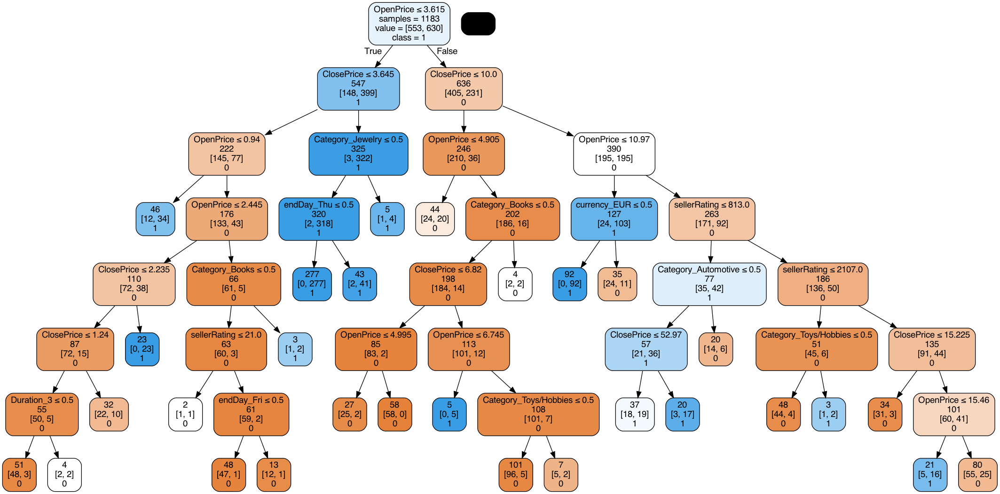

In [37]:
plotDecisionTree(classTree, feature_names = predictors, class_names=classTree.classes_)

In [25]:
# OpenPrice <= 3.615 and ClosePrice<=3.645 and OpnePrice<=0.94 then 1(=경쟁적 경매)
# OpenPrice >= 3.615 and ClosePrice<=10 and OpenPrice<=4.905 then 0(=비경쟁적 경매)
# 등등... 그림 참고

In [26]:
# b

In [31]:
print('<train>')
classificationSummary(train_set[outcome], classTree.predict(train_set[predictors]))

print('\n<valid>')
classificationSummary(valid_set[outcome], classTree.predict(valid_set[predictors]))

<train>
Confusion Matrix (Accuracy 0.8808)

       Prediction
Actual   0   1
     0 510  43
     1  98 532

<valid>
Confusion Matrix (Accuracy 0.8428)

       Prediction
Actual   0   1
     0 320  33
     1  91 345


In [36]:
importances = classTree.feature_importances_
df = pd.DataFrame({'predictor':predictors, 'importance':importances})
df

,predictor,importance
0,sellerRating,0.031354
1,ClosePrice,0.462425
2,OpenPrice,0.416574
3,Category_Antique/Art/Craft,0.000000
4,Category_Automotive,0.008237
5,Category_Books,0.009210
6,Category_Business/Industrial,0.000000
7,Category_Clothing/Accessories,0.000000
8,Category_Coins/Stamps,0.000000
9,Category_Collectibles,0.000000


accuracy 면에서 보면 준수한 accuracy에 큰 과적합은 없는 것으로 보인다.  
하지만 변수 중요도를 보면 대부분이 OpenPrice와 ClosePrice로 나누어지는 노드가 대부분이며 중요도가 0인 변수가 많은 것으로 보아  
해당 모델로 새로운 경매의 결과를 예측하는 것은 부적합하다고 고려된다.  

In [32]:
# c

Open Price 와 Close Price로 나누어지는 노드가 굉장히 많아서 중복되는 규칙이 많고,  
반면 Duratio과 endDay, Category의 가변수에 대한 규칙은 거의 영향력이 없다.  

In [34]:
# d

In [39]:
predictors = ['sellerRating', 'ClosePrice', 'OpenPrice', 'currency_EUR']

picked_Tree = DecisionTreeClassifier(random_state=0, max_depth=7, min_samples_split=50) 
picked_Tree.fit(train_set[predictors], train_set[outcome])

DecisionTreeClassifier(max_depth=7, min_samples_split=50, random_state=0)

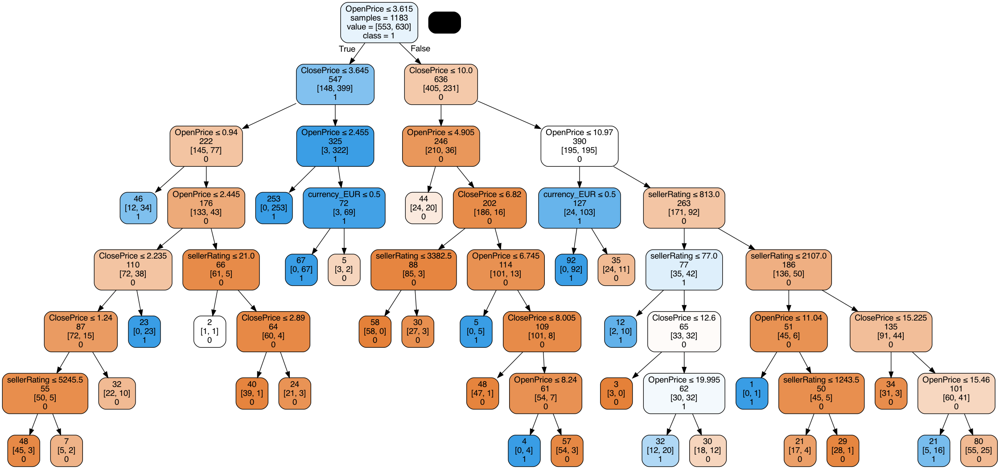

In [41]:
plotDecisionTree(picked_Tree, feature_names = predictors, class_names=picked_Tree.classes_)

OpenPrice <= 0.94 and ClosePrice <=3.645 then 1 (= 경쟁적 경매)  
OpenPrice <= 2.455 and closePrice >= 3.645 then 0(= 비경쟁적 구매)  
등등.. 그림참고

In [42]:
# e

In [46]:
df = pd.DataFrame({'ClosePrice':train_set['ClosePrice'], 'OpenPrice':train_set['OpenPrice'],
                   'predict':picked_Tree.predict(train_set[predictors])})
df

,ClosePrice,OpenPrice,predict
503,4.93,2.45,1
733,5.61,3.60,1
383,2.45,2.45,0
725,5.50,3.60,1
310,3.07,1.23,1
...,...,...,...
1791,33.95,33.95,0
1096,7.50,7.50,0
1932,154.23,79.99,0
235,1.23,1.23,0


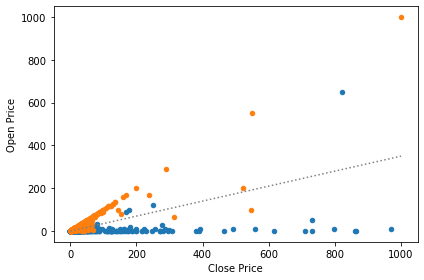

In [60]:
ax = df.loc[df.predict==1,:].plot.scatter(x='ClosePrice', y='OpenPrice', color='C0')
df.loc[df.predict==0,:].plot.scatter(x='ClosePrice', y='OpenPrice', ax=ax, color='C1')
plt.plot((0, 1000), (0, 350), ':', color='grey')
ax.set_xlabel('Close Price')
ax.set_ylabel('Open Price')

plt.tight_layout()
plt.show()

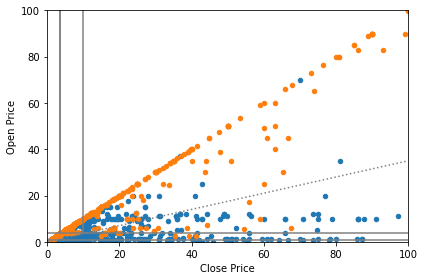

In [71]:
ax = df.loc[df.predict==1,:].plot.scatter(x='ClosePrice', y='OpenPrice', color='C0')
df.loc[df.predict==0,:].plot.scatter(x='ClosePrice', y='OpenPrice', ax=ax, color='C1')
plt.plot((0, 1000), (0, 350), ':', color='grey')
ax.set_xlabel('Close Price')
ax.set_ylabel('Open Price')

plt.xlim([0, 100])      # X축의 범위: [xmin, xmax]
plt.ylim([0, 100])     # Y축의 범위: [ymin, ymax]

y0 = 3.615
x1 = 3.645
x2 = 10
y1 = 0.94
ax.plot((0, 100), (y0, y0), color='grey')
ax.plot((x1, x1), (3.615, 100), color='grey')
ax.plot((x2, x2), (3.615, 100), color='grey')
ax.plot((x1, x1), (3.615, 100), color='grey')
ax.plot((0, 100), (y1, y1), color='grey')
# 생략

plt.tight_layout()
plt.show()

효율적이지 못하다. 두 변수는 선형성을 띄고 있어서 이런 수직/수평적 분할은 적합하지 않다. 

In [72]:
# f

In [74]:
# confusion matrix

print('<train>')
classificationSummary(train_set[outcome], picked_Tree.predict(train_set[predictors]))

print('\n<valid>')
classificationSummary(valid_set[outcome], picked_Tree.predict(valid_set[predictors]))

<train>
Confusion Matrix (Accuracy 0.8850)

       Prediction
Actual   0   1
     0 522  31
     1 105 525

<valid>
Confusion Matrix (Accuracy 0.8492)

       Prediction
Actual   0   1
     0 328  25
     1  94 342


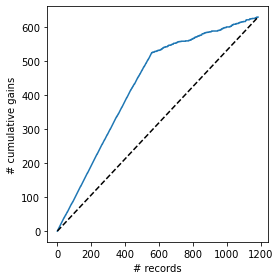

In [76]:
# lift chart

from dmba import classificationSummary, gainsChart

df = pd.DataFrame({'actual': train_set[outcome], 'prob': picked_Tree.predict(train_set[predictors])})
df = df.sort_values(by=['prob'], ascending=False).reset_index(drop=True)

fig, ax = plt.subplots()
fig.set_size_inches(4, 4)
gainsChart(df.actual, ax=ax)

plt.tight_layout()
plt.show()

성능은 나쁘지 않아 보인다.

In [77]:
# g

In [78]:
# ???

In [79]:
# 9.2

In [95]:
flight = pd.read_csv('FlightDelays.csv')
flight.head()

,CRS_DEP_TIME,CARRIER,DEP_TIME,DEST,DISTANCE,FL_DATE,FL_NUM,ORIGIN,Weather,DAY_WEEK,DAY_OF_MONTH,TAIL_NUM,Flight Status
0,1455,OH,1455,JFK,184,01/01/2004,5935,BWI,0,4,1,N940CA,ontime
1,1640,DH,1640,JFK,213,01/01/2004,6155,DCA,0,4,1,N405FJ,ontime
2,1245,DH,1245,LGA,229,01/01/2004,7208,IAD,0,4,1,N695BR,ontime
3,1715,DH,1709,LGA,229,01/01/2004,7215,IAD,0,4,1,N662BR,ontime
4,1039,DH,1035,LGA,229,01/01/2004,7792,IAD,0,4,1,N698BR,ontime


In [89]:
flight.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2201 entries, 0 to 2200
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   CRS_DEP_TIME   2201 non-null   int64   
 1   CARRIER        2201 non-null   object  
 2   DEP_TIME       2201 non-null   int64   
 3   DEST           2201 non-null   object  
 4   DISTANCE       2201 non-null   int64   
 5   FL_DATE        2201 non-null   object  
 6   FL_NUM         2201 non-null   int64   
 7   ORIGIN         2201 non-null   object  
 8   Weather        2201 non-null   int64   
 9   DAY_WEEK       2201 non-null   category
 10  DAY_OF_MONTH   2201 non-null   int64   
 11  TAIL_NUM       2201 non-null   object  
 12  Flight Status  2201 non-null   int64   
 13  Binned_time    2201 non-null   category
dtypes: category(2), int64(7), object(5)
memory usage: 211.5+ KB


In [96]:
flight['Flight Status'] = flight['Flight Status'].replace('ontime',0)
flight['Flight Status'] = flight['Flight Status'].replace('delayed',1)

In [97]:
# CRS_DEP_TIME : 예측 출발 시간
# DEP_TIME : 출발 시간

flight['DAY_WEEK'] = flight.DAY_WEEK.astype('category')
Binned_time = pd.cut(flight['CRS_DEP_TIME'], 8) 
flight['Binned_time'] = Binned_time

flight.head()

,CRS_DEP_TIME,CARRIER,DEP_TIME,DEST,DISTANCE,FL_DATE,FL_NUM,ORIGIN,Weather,DAY_WEEK,DAY_OF_MONTH,TAIL_NUM,Flight Status,Binned_time
0,1455,OH,1455,JFK,184,01/01/2004,5935,BWI,0,4,1,N940CA,0,"(1365.0, 1556.25]"
1,1640,DH,1640,JFK,213,01/01/2004,6155,DCA,0,4,1,N405FJ,0,"(1556.25, 1747.5]"
2,1245,DH,1245,LGA,229,01/01/2004,7208,IAD,0,4,1,N695BR,0,"(1173.75, 1365.0]"
3,1715,DH,1709,LGA,229,01/01/2004,7215,IAD,0,4,1,N662BR,0,"(1556.25, 1747.5]"
4,1039,DH,1035,LGA,229,01/01/2004,7792,IAD,0,4,1,N698BR,0,"(982.5, 1173.75]"


In [98]:
flight_ = flight.drop(columns=['CRS_DEP_TIME','DAY_OF_MONTH'])
flight_dum = pd.get_dummies(flight_)
flight_dum.head()

,DEP_TIME,DISTANCE,FL_NUM,Weather,Flight Status,CARRIER_CO,CARRIER_DH,CARRIER_DL,CARRIER_MQ,CARRIER_OH,...,TAIL_NUM_N995CA,TAIL_NUM_N997DL,"Binned_time_(598.47, 791.25]","Binned_time_(791.25, 982.5]","Binned_time_(982.5, 1173.75]","Binned_time_(1173.75, 1365.0]","Binned_time_(1365.0, 1556.25]","Binned_time_(1556.25, 1747.5]","Binned_time_(1747.5, 1938.75]","Binned_time_(1938.75, 2130.0]"
0,1455,184,5935,0,0,0,0,0,0,1,...,0,0,0,0,0,0,1,0,0,0
1,1640,213,6155,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0
2,1245,229,7208,0,0,0,1,0,0,0,...,0,0,0,0,0,1,0,0,0,0
3,1709,229,7215,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0
4,1035,229,7792,0,0,0,1,0,0,0,...,0,0,0,0,1,0,0,0,0,0


In [101]:
train_set, valid_set = train_test_split(flight_dum, test_size=0.4, random_state=1)

In [100]:
# a

In [108]:
predictors = flight_dum.drop(columns=['Flight Status','DEP_TIME']).columns
outcome = 'Flight Status'

classTree = DecisionTreeClassifier(random_state=0, max_depth=8, min_impurity_decrease=0.01) 
classTree.fit(train_set[predictors], train_set[outcome])

DecisionTreeClassifier(max_depth=8, min_impurity_decrease=0.01, random_state=0)

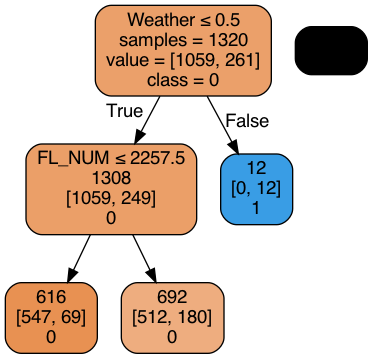

In [109]:
plotDecisionTree(classTree, feature_names = predictors, class_names=classTree.classes_)

Weather >= 0.5 then 1 (delayed)  
Weather <= 0.5 then 0 (ontime)

In [ ]:
# b 
# 해당 모델은 부적합하다고 생각한다. origin, day_week, CRS_DEP_TIME 등의 변수가 필요하다고 생각한다. 
# 노드가 너무 적어 예측도가 떨어질 것이라고 생각한다. 

In [105]:
# c

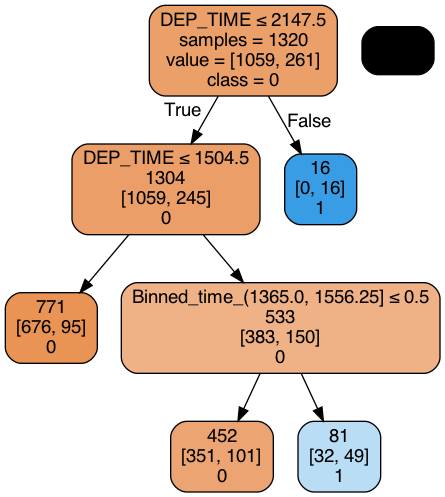

In [110]:
predictors = flight_dum.drop(columns=['Flight Status','Weather']).columns
outcome = 'Flight Status'

# small tree
classTree = DecisionTreeClassifier(random_state=0, max_depth=8, min_impurity_decrease=0.01) 
classTree.fit(train_set[predictors], train_set[outcome])
plotDecisionTree(classTree, feature_names = predictors, class_names=classTree.classes_)

In [107]:
# full grown
classTree = DecisionTreeClassifier(random_state=0) 
classTree.fit(train_set[predictors], train_set[outcome])
plotDecisionTree(classTree, feature_names = predictors, class_names=classTree.classes_)

In [111]:
# i

DEP_TIME >= 2147.5 then 1 (delayed)  
DEP_TIME <= 2147.5 and DEP_TIME <= 1504.5 then 0 (ontime)  
DEP_TIME <= 2147.5 and DEP_TIME >= 1504.5 and Binned_time_(1365.0, 1556.25]<=0.5533 then 0  
DEP_TIME <= 2147.5 and DEP_TIME >= 1504.5 and Binned_time_(1365.0, 1556.25]>=0.5533 then 1

In [112]:
# ii

규칙에 상응하는 것..? 문제를 이해를 못하겠습니다. 

In [113]:
# iii

DEP_TIME, FL_NUM, Binned_time (몇 구간인지는 안 보임)

In [114]:
# iv

In [115]:
# single nodeㄱㅏ 안ㄴㅏ왓는디...

In [116]:
# v

분할잠재력이 많은 '선호'하는 예측변수이기 때문이다.

In [117]:
# vi

logistic regression 아직 안 배움

In [ ]:
# 9.3

In [71]:
toyota = pd.read_csv("ToyotaCorolla.csv")
toyota.head(1)

,Id,Model,Price,Age_08_04,Mfg_Month,Mfg_Year,KM,Fuel_Type,HP,Met_Color,...,Powered_Windows,Power_Steering,Radio,Mistlamps,Sport_Model,Backseat_Divider,Metallic_Rim,Radio_cassette,Parking_Assistant,Tow_Bar
0,1,TOYOTA Corolla 2.0 D4D HATCHB TERRA 2/3-Doors,13500,23,10,2002,46986,Diesel,90,1,...,1,1,0,0,0,1,0,0,0,0


In [74]:
toyota_dum = pd.get_dummies(toyota, columns=['Fuel_Type'])
toyota_dum.head(1)

,Id,Model,Price,Age_08_04,Mfg_Month,Mfg_Year,KM,HP,Met_Color,Color,...,Mistlamps,Sport_Model,Backseat_Divider,Metallic_Rim,Radio_cassette,Parking_Assistant,Tow_Bar,Fuel_Type_CNG,Fuel_Type_Diesel,Fuel_Type_Petrol
0,1,TOYOTA Corolla 2.0 D4D HATCHB TERRA 2/3-Doors,13500,23,10,2002,46986,90,1,Blue,...,0,0,1,0,0,0,0,0,1,0


In [51]:
train_set, valid_set = train_test_split(toyota_dum, test_size=0.4, random_state=1)

In [5]:
# a

In [52]:
predictors = ['Age_08_04', 'KM', 'Fuel_Type_CNG','Fuel_Type_Diesel','Fuel_Type_Petrol', 'HP', 'Automatic', 'Doors', 
              'Quarterly_Tax', 'Mfr_Guarantee', 'Guarantee_Period', 'Airco', 'Automatic_airco', 
              'CD_Player', 'Powered_Windows', 'Sport_Model', 'Tow_Bar']
outcome = 'Price'

In [53]:
from sklearn.tree import DecisionTreeRegressor

In [54]:
# 회귀 모델 트리 생성 및 train 세트에 fit 

reg = DecisionTreeRegressor(random_state=1)
reg.fit(train_set[predictors], train_set[outcome])

DecisionTreeRegressor(random_state=1)

In [18]:
# tree 그림 그리기

plotDecisionTree(reg, feature_names=predictors)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.996866 to fit



In [20]:
# i

In [75]:
df = pd.DataFrame({'predictor':predictors, 'importance':reg.feature_importances_})
df.head(4)

,predictor,importance
0,Age_08_04,0.833860
1,KM,0.059787
2,Fuel_Type_CNG,0.000337
3,Fuel_Type_Diesel,0.000480


In [ ]:
# Age_08_04, KM, Fuel_Type_CNG, Fuel_Type_Dissel

In [31]:
# ii

In [34]:
# train RMSE = 0
regressionSummary(train_set[outcome],reg.predict(train_set[predictors]))


Regression statistics

                      Mean Error (ME) : 0.0000
       Root Mean Squared Error (RMSE) : 0.0000
            Mean Absolute Error (MAE) : 0.0000
          Mean Percentage Error (MPE) : 0.0000
Mean Absolute Percentage Error (MAPE) : 0.0000


In [35]:
# valid RMSE = 1451.0953
regressionSummary(valid_set[outcome], reg.predict(valid_set[predictors]))


Regression statistics

                      Mean Error (ME) : 36.2939
       Root Mean Squared Error (RMSE) : 1451.0953
            Mean Absolute Error (MAE) : 1122.9061
          Mean Percentage Error (MPE) : -0.8307
Mean Absolute Percentage Error (MAPE) : 11.2783


In [ ]:
# full-grown 하게 모델을 만들었기 때문에 train 세트에 대한 아예 발생하지 않는다. 
# 그에 반해 train 세트의 잡음까지 포함한 모델은 새로운 데이터인 valid 세트에 대해 큰 오차를 보인다. 

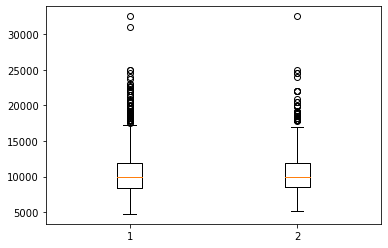

In [43]:
fig, ax = plt.subplots()
ax.boxplot([reg.predict(train_set[predictors]), reg.predict(valid_set[predictors])])
plt.show()

In [ ]:
# ⭐️❓
# 학습 데이터에 반해 검증 데이터의 이상치가 매우 적다. 
# 이는 full-grown tree가 학습 데이터의 잡음까지도 다 반영하여 중요하지 않은 이상치들도 다 포함하였지만
# 검증 데이터에 대해서는 이를 다 반영하지 못한 것으로 생각된다.

In [44]:
# iii

In [ ]:
# tree의 depth를 제한하여(=성장을 억제하여) train 세트에 대한 모델의 과적합을 방지하여야 한다. 

In [45]:
# iv

In [56]:
param_grid = {
    'max_depth' : [10,20,30,40],
    'min_samples_split' : [20,40,60,80,100],
    'min_impurity_decrease' : [0, 0.0005, 0.001, 0.005, 0.01]
}
gridSearch = GridSearchCV(DecisionTreeRegressor(random_state=1), param_grid, cv=5, n_jobs=-1) 
# cv : 교차검정 횟수 / n_jobs : -1 will utilize all available CPUs 
#                  진짜 해당 하드웨어의 CPU(코어)수 말하는듯. -1하면 모든 씨피유 사용해서 매우 뜨거워짐
gridSearch.fit(train_set[predictors], train_set[outcome])
print('Initial score : ', gridSearch.best_score_)
print('Initial parameters : ', gridSearch.best_params_)

Initial score :  0.863916436847991
Initial parameters :  {'max_depth': 10, 'min_impurity_decrease': 0, 'min_samples_split': 20}


In [58]:
# fine-tuned tree RMSE = 1286.65 <-> full-grown tree RMSE = 1451.09

bestRegTree = gridSearch.best_estimator_
regressionSummary(valid_set[outcome], bestRegTree.predict(valid_set[predictors]))


Regression statistics

                      Mean Error (ME) : -2.2553
       Root Mean Squared Error (RMSE) : 1286.6489
            Mean Absolute Error (MAE) : 976.3005
          Mean Percentage Error (MPE) : -1.2347
Mean Absolute Percentage Error (MAPE) : 9.6699


In [49]:
# b

In [36]:
labels = list(range(1,21))
labels

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]

In [39]:
Binned_Price = pd.cut(toyota_dum['Price'], 20, labels = labels) 
# pd.cut(구간을 나눌 series, bin = 몇개로 나눌지)
# : bin으로 지정한 갯수로 동일한 길이로 나눔. 구간을 나눈 데이터를 카테고리형으로 반환
toyota_dum['Binned_Price'] = Binned_Price
toyota_bin = toyota_dum.drop(columns=['Price'])
toyota_bin.head(2)

,Id,Model,Age_08_04,Mfg_Month,Mfg_Year,KM,HP,Met_Color,Color,Automatic,...,Sport_Model,Backseat_Divider,Metallic_Rim,Radio_cassette,Parking_Assistant,Tow_Bar,Fuel_Type_CNG,Fuel_Type_Diesel,Fuel_Type_Petrol,Binned_Price
0,1,TOYOTA Corolla 2.0 D4D HATCHB TERRA 2/3-Doors,23,10,2002,46986,90,1,Blue,0,...,0,1,0,0,0,0,0,1,0,7
1,2,TOYOTA Corolla 2.0 D4D HATCHB TERRA 2/3-Doors,23,10,2002,72937,90,1,Silver,0,...,0,1,0,0,0,0,0,1,0,7


In [40]:
train_X, valid_X, train_y, valid_y = train_test_split(toyota_bin[predictors], toyota_bin['Binned_Price'], test_size=0.4, random_state=1)

1238    3
1085    3
680     3
593     5
647     2
       ..
715     3
905     4
1096    3
235     6
1061    2
Name: Binned_Price, Length: 861, dtype: category
Categories (20, int64): [1 < 2 < 3 < 4 ... 17 < 18 < 19 < 20]

In [44]:
param_grid = {
    'max_depth' : [10,20,30,40],
    'min_samples_split' : [20,40,60,80,100],
    'min_impurity_decrease' : [0, 0.0005, 0.001, 0.005, 0.01] 
}

gridSearch = GridSearchCV(DecisionTreeClassifier(random_state=1), param_grid, cv=5, n_jobs=-1)

In [45]:
gridSearch.fit(train_X, train_y)
print('Improved score : ', gridSearch.best_score_) # gridSearch.best_score_ : accuracy
print('Improved parameters : ', gridSearch.best_params_) # gridSearch.best_params_ : 격자탐색으로 얻은 최고의 파라미터 값

bestClassTree = gridSearch.best_estimator_ # 격자탐색으로 얻은 최고의 모델

/Users/JAE111/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_split.py:666: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"


Improved score :  0.45996773759913967
Improved parameters :  {'max_depth': 10, 'min_impurity_decrease': 0.01, 'min_samples_split': 20}


In [46]:
# i

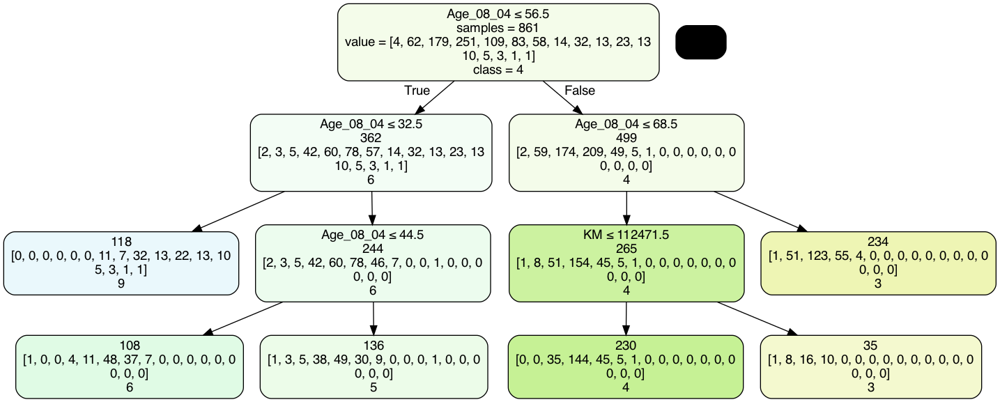

In [47]:
# classification
plotDecisionTree(bestClassTree, feature_names=predictors,
                 class_names=bestClassTree.classes_)

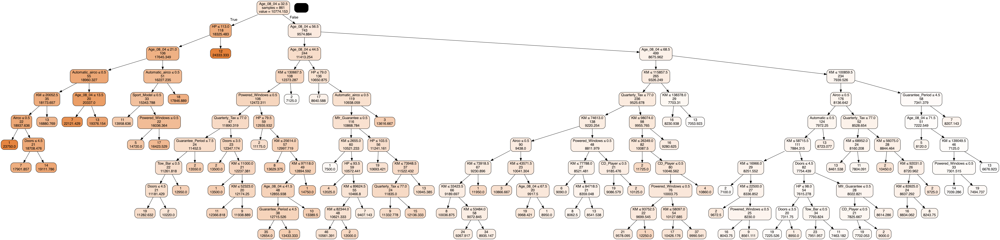

In [59]:
# regression
plotDecisionTree(bestRegTree, feature_names=predictors)

In [ ]:
# regression이 classification보다 훨씬 노드의 분할이 많다. (=나무의 크기가 크다)
# 또한 top_node는 Age로, 둘 다 동일하다.

# 이유 : 회귀 나무의 불순도 측정과 분류 나무의 불순도 측정 방법이 다르기 때문에 ..(?) # ⭐️❓

In [60]:
# ii

In [65]:
new = pd.DataFrame ({
           'Age_08_04' : [77],
           'KM' : [117000],
           'Fuel_Type_Petrol' :[1],
           'Fuel_Type_CNG' :[0],
           'Fuel_Type_Dissel' :[0],
           'HP': [110],
           'Automatic': [0],
           'Doors': [5],
           'Quarterly_Tax': [100],
           'Mfg_Guarantee': [0],
           'Guarantee_Period': [3],
           'Airco': [0],
           'Automatic_airco': [1],
           'CD_Player':[1],
           'Powered_Windows':[1],
           'Sport_Model': [1],
           'Tow_Bar' :[0]
       })

In [66]:
print(bestClassTree.predict(new)) # 3 : (7165.0, 8572.5] 
print(bestRegTree.predict(new))

[3]
[7494.73684211]


In [69]:
# iii

In [ ]:
# 사용된 변수, 두 예측 결과 간의 차이, 두 방법의 장단점 측면에서 비교

# 회귀 나무의 예측값이 분류 나무의 예측 범주(범위)와 상응하여 둘이 비슷한 예측을 했다고 볼 수 있다. 
# 분류 나무는 값이 범주로 나누어져 있어 회귀 나무와 같이 정확한 단일값을 얻지 못한다는 단점이 있지만 
# 클래스로 묶여서 나무 모형이 훨씬 간단(크기가 작음)하다는 장점이 있다. 